# 元学习语义分割模型训练与验证

本笔记本包含两个主要部分：
1. **模型训练部分** - 训练多种元学习架构
2. **可视化验证部分** - 模型性能对比与结果可视化

## 第一部分：模型训练

### 训练环境设置与数据准备

本部分将训练以下四种元学习架构：
- Standard + SE Attention
- Depthwise Separable + CBAM
- Dilated Convolution + Spatial Attention
- Group Convolution + ECA Attention

In [1]:
# 导入必要的库
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import albumentations as albu
import torch
import torch.nn as nn
import torch.nn.functional as F
import segmentation_models_pytorch as smp
from torch.utils.data import DataLoader, Dataset
import itertools
import json

# 环境配置
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# 设备配置
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'使用设备: {DEVICE}')

# 超参数设置
# BATCH_SIZE = 8
# LEARNING_RATE = 1e-4
# NUM_EPOCHS = 30
# IMAGE_SIZE = (256, 256)
NUM_CLASSES = 12

# 类别权重设置 - 针对小类别给予更高权重
class_weights = torch.ones(NUM_CLASSES)  # 默认权重为1
class_weights[2] = 10.0   # pole
class_weights[6] = 5.0   # signsymbol  
class_weights[7] = 5.0   # fence
class_weights[9] = 5.0   # pedestrian
class_weights[10] = 5.0  # bicyclist
class_weights = class_weights.view(NUM_CLASSES, 1, 1).to(DEVICE)

使用设备: cuda


### 数据集定义

定义CamVid数据集类，用于语义分割任务。包含12个类别的城市场景分割。

In [2]:
# ==================== 数据集类 ====================
class CamVidDataset(torch.utils.data.Dataset):
    CLASSES = ['sky', 'building', 'pole', 'road', 'pavement', 'tree', 'signsymbol', 'fence', 'car', 'pedestrian', 'bicyclist', 'unlabelled']
    
    def __init__(
        self, 
        images_dir,
        masks_dir,
        classes=None,
        augmentation=None,
        preprocessing=None,
    ):
        self.ids = os.listdir(images_dir)
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]
        
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        mask = cv2.imread(self.masks_fps[i], cv2.IMREAD_GRAYSCALE)
        masks = [(mask == v) for v in self.class_values]
        mask = np.dstack(masks).astype('float')
        
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        return len(self.ids)

### 卷积块定义

定义四种不同类型的卷积块：
- **标准卷积块**: 传统的卷积+批归一化+ReLU结构
- **深度可分离卷积块**: 减少参数量的高效卷积结构
- **空洞卷积块**: 扩大感受野而不增加参数
- **组卷积块**: 通道分组卷积，平衡效率与性能

In [3]:
# ==================== 不同类型的卷积块 ====================

# 标准卷积块
class StandardConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        return self.relu(self.bn(self.conv(x)))

# 深度可分离卷积块
class DepthwiseSeparableConv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super().__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size, stride, padding, groups=in_channels, bias=False)
        self.pointwise = nn.Conv2d(in_channels, out_channels, 1, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)
        return self.relu(self.bn(x))

# 空洞卷积块
class DilatedConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, dilation=2):
        super().__init__()
        padding = dilation * (kernel_size - 1) // 2
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, padding=padding, dilation=dilation, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        return self.relu(self.bn(self.conv(x)))

# 组卷积块
class GroupConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1, groups=8):
        super().__init__()
        # 确保通道数能被组数整除
        self.groups = min(groups, in_channels, out_channels)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, groups=self.groups, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        return self.relu(self.bn(self.conv(x)))

### 注意力机制定义

定义四种不同类型的注意力机制：
- **SE注意力**: 通道注意力机制，通过全局平均池化学习通道重要性
- **CBAM注意力**: 结合通道和空间注意力的复合机制
- **轻量级空间注意力**: 使用卷积实现的高效空间注意力
- **ECA注意力**: 高效通道注意力，避免降维操作

In [4]:
# ==================== 不同类型的注意力机制 ====================

# SE注意力（Squeeze-and-Excitation）
class SEAttention(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(in_channels // reduction, in_channels, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

# CBAM注意力（Convolutional Block Attention Module）
class CBAMAttention(nn.Module):
    def __init__(self, in_channels, reduction=16, kernel_size=7):
        super().__init__()
        # 通道注意力
        self.channel_attention = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels, in_channels // reduction, 1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels // reduction, in_channels, 1, bias=False)
        )
        # 空间注意力
        self.spatial_attention = nn.Sequential(
            nn.Conv2d(2, 1, kernel_size, padding=kernel_size//2, bias=False),
            nn.BatchNorm2d(1)
        )
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        # 通道注意力
        avg_out = self.channel_attention(x)
        max_out = self.channel_attention(x)
        channel_att = self.sigmoid(avg_out + max_out)
        x = x * channel_att
        
        # 空间注意力
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        spatial_in = torch.cat([avg_out, max_out], dim=1)
        spatial_att = self.sigmoid(self.spatial_attention(spatial_in))
        x = x * spatial_att
        
        return x

# 轻量级空间注意力机制
class LightweightSpatialAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        # 使用1x1和3x3卷积生成空间注意力
        self.conv1 = nn.Conv2d(in_channels, in_channels // 8, 1)
        self.bn1 = nn.BatchNorm2d(in_channels // 8)
        self.conv2 = nn.Conv2d(in_channels // 8, in_channels // 8, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(in_channels // 8)
        self.conv3 = nn.Conv2d(in_channels // 8, 1, 1)
        self.sigmoid = nn.Sigmoid()
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, x):
        # 生成空间注意力图
        att = self.conv1(x)
        att = self.bn1(att)
        att = self.relu(att)
        
        att = self.conv2(att)
        att = self.bn2(att)
        att = self.relu(att)
        
        att = self.conv3(att)
        att = self.sigmoid(att)
        
        # 应用注意力
        return x * att

# ECA注意力 - 高效通道注意力
class ECAAttention(nn.Module):
    def __init__(self, in_channels, k_size=3):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        # 使用1D卷积替代全连接层，避免降维
        self.conv = nn.Conv1d(1, 1, kernel_size=k_size, padding=(k_size - 1) // 2, bias=False)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        # 特征描述符：全局平均池化
        b, c, _, _ = x.size()
        y = self.avg_pool(x)  # [B, C, 1, 1]
        
        # 1D卷积：跨通道交互，不降维
        y = self.conv(y.squeeze(-1).transpose(-1, -2)).transpose(-1, -2).unsqueeze(-1)  # [B, C, 1, 1]
        
        # 多尺度信息融合
        y = self.sigmoid(y)
        
        return x * y.expand_as(x)

# 无注意力（用于基线对比）
class NoAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
    
    def forward(self, x):
        return x

### 损失函数定义

In [5]:
class SMPCombinedLoss(nn.Module):
    def __init__(self, jaccard_weight=0.5, bce_weight=0.5, class_weights=None):
        super().__init__()
        # 将DiceLoss替换为JaccardLoss
        self.jaccard_loss = smp.losses.JaccardLoss(mode='multilabel', from_logits=True)
        # 添加类别权重支持
        if class_weights is not None:
            self.bce_loss = nn.BCEWithLogitsLoss(pos_weight=class_weights)
        else:
            self.bce_loss = nn.BCEWithLogitsLoss()
        self.jaccard_weight = jaccard_weight
        self.bce_weight = bce_weight
    
    def forward(self, inputs, targets):
        jaccard = self.jaccard_loss(inputs, targets)
        bce = self.bce_loss(inputs, targets)
        return self.jaccard_weight * jaccard + self.bce_weight * bce

### 元学习模型定义

定义基础元学习模型架构，支持不同的卷积块和注意力机制组合：
- 特征融合模块：整合多个基础模型的预测结果
- 可配置的卷积块：支持标准、深度可分离、空洞、组卷积
- 可配置的注意力机制：支持SE、CBAM、空间注意力、ECA等
- 特征精炼模块：生成最终的分割结果

In [6]:
# ==================== 不同的元模型变体 ====================

# 基础元模型类
class BaseMetaModel(nn.Module):
    def __init__(self, num_classes, conv_block, attention_module):
        super().__init__()
        self.num_classes = num_classes
        input_channels = num_classes * 3
        
        # 特征融合模块
        self.entry_conv = nn.Sequential(
            nn.Conv2d(input_channels, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        
        # 使用指定的卷积块类型
        self.conv_block1 = conv_block(256, 256)
        self.conv_block2 = conv_block(256, 256)
        self.conv_block3 = conv_block(256, 256)
        
        # 使用指定的注意力模块
        self.attention = attention_module(256)
        
        # 特征精炼
        self.refinement = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, num_classes, kernel_size=1)
        )
        
        # 跳跃连接
        self.skip_conv = nn.Conv2d(input_channels, num_classes, kernel_size=1)
    
    def forward(self, inputs):
        x = self.entry_conv(inputs)
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.attention(x)
        x = self.refinement(x)
        skip = self.skip_conv(inputs)
        return torch.sigmoid(x + skip)

In [7]:
# ==================== 创建不同的模型变体 ====================

def create_model_variants(num_classes):
    """创建不同的模型变体用于对比实验"""
    models = {}
    
    # 变体1: 标准卷积 + SE注意力
    models['standard_se'] = BaseMetaModel(
        num_classes=num_classes,
        conv_block=StandardConvBlock,
        attention_module=SEAttention
    )
    
    # 变体2: 深度可分离卷积 + CBAM注意力
    models['depthwise_cbam'] = BaseMetaModel(
        num_classes=num_classes,
        conv_block=DepthwiseSeparableConv,
        attention_module=CBAMAttention
    )
    
    # 变体3: 空洞卷积 + 轻量级空间注意力
    models['dilated_spatial'] = BaseMetaModel(
        num_classes=num_classes,
        conv_block=DilatedConvBlock,
        attention_module=LightweightSpatialAttention
    )
    
    # 变体4: 标准卷积 + 无注意力（基线）
    models['standard_none'] = BaseMetaModel(
        num_classes=num_classes,
        conv_block=StandardConvBlock,
        attention_module=NoAttention
    )
    
    # 变体5: 组卷积 + ECA注意力
    models['group_eca'] = BaseMetaModel(
        num_classes=num_classes,
        conv_block=GroupConvBlock,
        attention_module=ECAAttention
    )
    
    return models

### 数据预处理函数

定义训练和验证阶段的数据增强策略：
- 训练增强：包含随机翻转、旋转、缩放、亮度对比度调整
- 验证增强：仅进行尺寸调整
- 预处理函数：图像标准化和张量转换

In [8]:
# ==================== 数据预处理函数 ====================

def get_training_augmentation():
    return albu.Compose([
        albu.Resize(512, 512),
        albu.HorizontalFlip(p=0.5),
        albu.ShiftScaleRotate(
            scale_limit=0.2,
            rotate_limit=10,
            shift_limit=0.05,
            p=0.5,
            border_mode=cv2.BORDER_CONSTANT,
            value=0
        ),
        albu.RandomBrightnessContrast(p=0.3),
    ])

def get_validation_augmentation():
    return albu.Compose([
        albu.Resize(512, 512),
    ])

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32') if len(x.shape) == 3 else x.astype('float32')

def get_preprocessing(preprocessing_fn):
    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

# ==================== 元数据集类 ====================

class MetaDataset(torch.utils.data.Dataset):
    def __init__(self, data, labels):
        self.data = data
        self.labels = labels
    
    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]
    
    def __len__(self):
        return len(self.data)

# ==================== 计算IoU ====================

def calculate_iou(pred, target, threshold=0.5):
    """计算IoU"""
    pred = (pred > threshold).float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    if union == 0:
        return 1.0
    return (intersection / union).item()

def calculate_class_iou(pred, target, num_classes=12):
    """Calculate IoU for each class"""
    class_ious = []
    
    for class_idx in range(num_classes):
        if class_idx < pred.shape[2] and class_idx < target.shape[2]:
            pred_class = (pred[:, :, class_idx] > 0.5).astype(np.float32)
            target_class = (target[:, :, class_idx] > 0.5).astype(np.float32)
            
            intersection = np.sum(pred_class * target_class)
            union = np.sum(pred_class) + np.sum(target_class) - intersection
            
            if union > 0:
                iou = intersection / union
            else:
                iou = 1.0 if np.sum(target_class) == 0 else 0.0
            
            class_ious.append(iou)
        else:
            class_ious.append(0.0)
    
    return class_ious

### 训练函数

定义模型训练的核心函数：
- 支持多种损失函数组合
- 自适应学习率调整
- 自动保存最佳模型
- 详细的训练日志记录

In [9]:
# ==================== 训练函数 ====================

def train_model(model, train_loader, valid_loader, model_name, device, num_epochs=30):
    """训练单个模型"""
    print(f"\n{'='*50}")
    print(f"Training {model_name}")
    print(f"{'='*50}")
    
    model = model.to(device)
    
    # 损失函数和优化器
    # criterion = SMPCombinedLoss(dice_weight=0.5, bce_weight=0.5)
    # criterion = SMPCombinedLoss(dice_weight=0.5, bce_weight=0.5, class_weights=class_weights)
    criterion = SMPCombinedLoss(jaccard_weight=0.5, bce_weight=0.5, class_weights=class_weights)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3, min_lr=1e-5)
    
    best_iou = 0.0
    history = {'train_loss': [], 'valid_loss': [], 'valid_iou': []}
    
    for epoch in range(num_epochs):
        # 训练阶段
        model.train()
        train_loss = 0.0
        for data, labels in train_loader:
            data, labels = data.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, labels)
            
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
        
        # 验证阶段
        model.eval()
        valid_loss = 0.0
        valid_iou = 0.0
        with torch.no_grad():
            for data, labels in valid_loader:
                data, labels = data.to(device), labels.to(device)
                
                outputs = model(data)
                loss = criterion(outputs, labels)
                
                # 计算IoU
                batch_iou = calculate_iou(outputs, labels)
                
                valid_loss += loss.item()
                valid_iou += batch_iou
        
        # 计算平均指标
        train_loss = train_loss / len(train_loader)
        valid_loss = valid_loss / len(valid_loader)
        valid_iou = valid_iou / len(valid_loader)
        
        # 记录历史
        history['train_loss'].append(train_loss)
        history['valid_loss'].append(valid_loss)
        history['valid_iou'].append(valid_iou)
        
        # 更新学习率
        scheduler.step(valid_iou)
        
        # 保存最佳模型
        if valid_iou > best_iou:
            best_iou = valid_iou
            torch.save(model.state_dict(), f'Meta_{model_name}.pth')
            print(f"Epoch {epoch+1}, Best IoU: {best_iou:.4f}, Model saved!")
        
        # 打印训练信息
        if (epoch + 1) % 5 == 0:
            print(f"Epoch {epoch+1}/{num_epochs}")
            print(f"Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}, Valid IoU: {valid_iou:.4f}")
    
    print(f"\nTraining completed for {model_name}")
    print(f"Best validation IoU: {best_iou:.4f}")
    
    return history, best_iou


### main函数

执行完整的元学习实验流程：
1. 数据集初始化和预处理
2. 加载预训练的基础模型（UNet、DeepLabV3、UNet++）
3. 准备元学习训练数据
4. 训练不同的元模型变体
5. 对比分析实验结果

In [10]:
# ==================== 主函数 ====================

def main():
    # 设置参数
    DATA_DIR = './CamVid/'
    x_train_dir = os.path.join(DATA_DIR, 'train')
    y_train_dir = os.path.join(DATA_DIR, 'trainannot')
    x_valid_dir = os.path.join(DATA_DIR, 'val')
    y_valid_dir = os.path.join(DATA_DIR, 'valannot')
    
    ENCODER = 'resnet34'
    ENCODER_WEIGHTS = 'imagenet'
    CLASSES = ['sky', 'building', 'pole', 'road', 'pavement', 'tree', 'signsymbol', 'fence', 'car', 'pedestrian', 'bicyclist', 'unlabelled']
    ACTIVATION = 'sigmoid'
    DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)
    
    # 初始化数据集
    train_dataset = CamVidDataset(
        x_train_dir,
        y_train_dir,
        augmentation=get_training_augmentation(),
        preprocessing=get_preprocessing(preprocessing_fn),
        classes=CLASSES,
    )
    
    valid_dataset = CamVidDataset(
        x_valid_dir,
        y_valid_dir,
        augmentation=get_validation_augmentation(),
        preprocessing=get_preprocessing(preprocessing_fn),
        classes=CLASSES,
    )
    
    train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
    valid_loader = DataLoader(valid_dataset, batch_size=2, shuffle=False, num_workers=0)
    
    # 加载基础模型
    print("Loading base models...")
    model_unet = smp.Unet(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,  # 移除 sigmoid 激活
    ).to(DEVICE)
    
    model_deeplabv3 = smp.DeepLabV3(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,  # 移除 sigmoid 激活
    ).to(DEVICE)
    
    model_unetplusplus = smp.UnetPlusPlus(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,  # 移除 sigmoid 激活
        decoder_attention_type='scse',
    ).to(DEVICE)
    
    # 加载预训练权重
    model_unet.load_state_dict(torch.load('best_model_unet_params.pth', map_location=DEVICE))
    model_deeplabv3.load_state_dict(torch.load('best_model_deeplabv3_params.pth', map_location=DEVICE))
    model_unetplusplus.load_state_dict(torch.load('best_model_unetplusplus_params.pth', map_location=DEVICE))
    
    model_unet.eval()
    model_deeplabv3.eval()
    model_unetplusplus.eval()

        # 准备元模型训练数据
    print("Preparing meta-training data...")
    def prepare_meta_data(model_list, data_loader, device):
        all_predictions = []
        all_labels = []
        
        for model in model_list:
            model.eval()
        
        with torch.no_grad():
            for images, labels in data_loader:
                images, labels = images.to(device), labels.to(device)
                all_labels.append(labels.cpu())
                
                pred_list = []
                for model in model_list:
                    pred = model(images)
                    pred_list.append(pred.cpu())
                
                combined_pred = torch.cat(pred_list, dim=1)
                all_predictions.append(combined_pred)
        
        all_predictions = torch.cat(all_predictions, dim=0)
        all_labels = torch.cat(all_labels, dim=0)
        return all_predictions, all_labels
    
    model_list = [model_unetplusplus, model_unet, model_deeplabv3]
    meta_train_data, meta_train_labels = prepare_meta_data(model_list, train_loader, DEVICE)
    meta_valid_data, meta_valid_labels = prepare_meta_data(model_list, valid_loader, DEVICE)
    
    # 创建元数据加载器
    meta_train_dataset = MetaDataset(meta_train_data, meta_train_labels)
    meta_valid_dataset = MetaDataset(meta_valid_data, meta_valid_labels)
    meta_train_loader = DataLoader(meta_train_dataset, batch_size=2, shuffle=True)
    meta_valid_loader = DataLoader(meta_valid_dataset, batch_size=2, shuffle=False)

        # 创建并训练不同的模型变体
    model_variants = create_model_variants(len(CLASSES))
    
    results = {}
    for model_name, model in model_variants.items():
        history, best_iou = train_model(
            model, 
            meta_train_loader, 
            meta_valid_loader, 
            model_name, 
            DEVICE,
            num_epochs=10
        )
        results[model_name] = {
            'history': history,
            'best_iou': best_iou
        }
    # 打印最终结果对比
    print("\n" + "="*60)
    print("Final Results Comparison:")
    print("="*60)
    print(f"{'Model Name':<20} {'Best IoU':<10} {'Description':<30}")
    print("-"*60)
    descriptions = {
        'standard_se': 'Standard Conv + SE Attention',
        'depthwise_cbam': 'Depthwise Conv + CBAM Attention',
        'dilated_spatial': 'Dilated Conv + Spatial Attention',
        'standard_none': 'Standard Conv + No Attention',
        'group_eca': 'Group Conv + ECA Attention'
    }
    
    for model_name, result in results.items():
        desc = descriptions.get(model_name, 'Unknown')
        print(f"{model_name:<20} {result['best_iou']:<10.4f} {desc:<30}")
    print("="*60)
    
    # 保存结果
    detailed_results = {}
    for model_name, result in results.items():
        detailed_results[model_name] = {
            'best_iou': result['best_iou'],
            'description': descriptions.get(model_name, 'Unknown')
        }
    
    with open('model_comparison_results.json', 'w') as f:
        json.dump(detailed_results, f, indent=4)
    
    print("\nAll models trained successfully!")
    print("Results saved to 'model_comparison_results.json'")

### 执行实验

In [11]:
result = main()

Loading base models...
Preparing meta-training data...

Training standard_se
Epoch 1, Best IoU: 0.8811, Model saved!
Epoch 2, Best IoU: 0.8814, Model saved!
Epoch 5/10
Train Loss: 0.7668, Valid Loss: 0.7888, Valid IoU: 0.8811
Epoch 10/10
Train Loss: 0.7641, Valid Loss: 0.7887, Valid IoU: 0.8804

Training completed for standard_se
Best validation IoU: 0.8814

Training depthwise_cbam
Epoch 1, Best IoU: 0.8821, Model saved!
Epoch 2, Best IoU: 0.8821, Model saved!
Epoch 5/10
Train Loss: 0.7696, Valid Loss: 0.7889, Valid IoU: 0.8808
Epoch 10/10
Train Loss: 0.7667, Valid Loss: 0.7887, Valid IoU: 0.8801

Training completed for depthwise_cbam
Best validation IoU: 0.8821

Training dilated_spatial
Epoch 1, Best IoU: 0.8650, Model saved!
Epoch 2, Best IoU: 0.8651, Model saved!
Epoch 5/10
Train Loss: 0.7659, Valid Loss: 0.7908, Valid IoU: 0.8642
Epoch 10/10
Train Loss: 0.7670, Valid Loss: 0.7907, Valid IoU: 0.8620

Training completed for dilated_spatial
Best validation IoU: 0.8651

Training standa

## 训练结果可视化

In [11]:
# 可视化相关导入和设置
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import random
import json
from pathlib import Path

# 设置英文字体
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['axes.unicode_minus'] = False

# 定义类别和颜色
CLASSES = ['sky', 'building', 'pole', 'road', 'pavement', 'tree', 
           'signsymbol', 'fence', 'car', 'pedestrian', 'bicyclist', 'unlabelled']

COLORS = [
    (128, 128, 128),   # sky - 天空
    (128, 0, 0),       # building - 建筑
    (192, 192, 128),   # pole - 杆子
    (128, 64, 128),    # road - 道路
    (0, 0, 192),       # pavement - 人行道
    (0, 128, 0),       # tree - 树
    (128, 128, 0),     # signsymbol - 标志符号
    (192, 128, 128),   # fence - 围栏
    (64, 0, 128),      # car - 汽车
    (64, 64, 0),       # pedestrian - 行人
    (0, 128, 192),     # bicyclist - 骑行者
    (0, 0, 0)          # unlabelled - 未标记
]

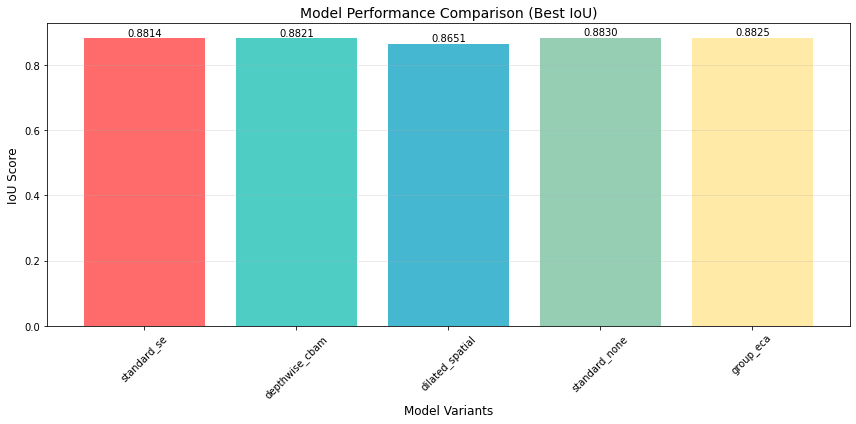

In [12]:
# 加载结果
with open('model_comparison_results.json', 'r') as f:
    results = json.load(f)

# 只能绘制模型对比图（因为没有训练历史数据）
def plot_model_comparison_from_json(results, save_path=None):
    model_names = list(results.keys())
    best_ious = [results[name]['best_iou'] for name in model_names]
    
    plt.figure(figsize=(12, 6))
    bars = plt.bar(model_names, best_ious, color=['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7'])
    
    # 添加数值标签
    for bar, iou in zip(bars, best_ious):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001,
                f'{iou:.4f}', ha='center', va='bottom', fontsize=10)
    
    plt.title('Model Performance Comparison (Best IoU)', fontsize=14)
    plt.xlabel('Model Variants', fontsize=12)
    plt.ylabel('IoU Score', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# 调用可视化
plot_model_comparison_from_json(results, 'model_comparison.png')

## 第二部分：模型加载与可视化验证

### 加载已训练模型进行可视化对比

本部分将加载已训练的基础模型和元学习模型，对测试集中的样本进行预测，
并生成详细的可视化对比结果，包括：
- 各模型预测结果对比
- IoU性能指标分析
- 注意力机制可视化
- 类别级别性能分析

In [13]:
# 导入可视化所需的额外库
import random
import platform
import warnings
warnings.filterwarnings('ignore')

# 设置跨平台中文字体
def setup_chinese_font():
    """根据操作系统设置中文字体"""
    system = platform.system()
    
    if system == "Windows":
        fonts = ['Microsoft YaHei', 'SimHei', 'SimSun']
    elif system == "Darwin":  # macOS
        fonts = ['Arial Unicode MS', 'Heiti TC', 'PingFang SC']
    else:  # Linux
        fonts = ['WenQuanYi Micro Hei', 'Noto Sans CJK SC', 'DejaVu Sans']
    
    for font in fonts:
        try:
            plt.rcParams['font.sans-serif'] = [font]
            fig, ax = plt.subplots(figsize=(1, 1))
            ax.text(0.5, 0.5, '测试', fontsize=12, ha='center', va='center')
            plt.close(fig)
            print(f"使用字体: {font}")
            break
        except:
            continue
    else:
        print("警告: 未找到合适的中文字体，将使用默认字体")
        plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
    
    plt.rcParams['axes.unicode_minus'] = False

# 初始化字体设置
setup_chinese_font()

使用字体: WenQuanYi Micro Hei


In [14]:
# 高级可视化函数
def visualize_segmentation_advanced(
        image,
        mask,
        class_names=CLASSES,
        colors=None,
        alpha=0.5,
        show_legend=True,
        title="分割结果",
        figsize=(12, 8)
):
    """高级语义分割结果可视化"""
    if colors is None:
        colors = [(128, 128, 128), (128, 0, 0), (192, 192, 128), (128, 64, 128),
                 (0, 0, 192), (0, 128, 0), (128, 128, 0), (192, 128, 128),
                 (64, 0, 128), (64, 64, 0), (0, 128, 192), (0, 0, 0)]
    
    vis_image = image.copy()
    
    # 确保图像和掩码具有相同的尺寸
    if vis_image.shape[:2] != mask.shape[:2]:
        mask = cv2.resize(mask, (vis_image.shape[1], vis_image.shape[0]), interpolation=cv2.INTER_NEAREST)
    
    # 转换掩码为RGB格式
    mask_rgb = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i, class_idx in enumerate(range(mask.shape[2])):
        mask_rgb[mask[:, :, class_idx] > 0.5] = colors[i]
    
    # 合并图像和掩码
    overlaid = cv2.addWeighted(vis_image, 1, mask_rgb, alpha, 0)
    
    # 创建图形
    plt.figure(figsize=figsize)
    plt.imshow(overlaid)
    plt.title(title, fontsize=15)
    plt.axis('off')
    
    # 添加图例
    if show_legend:
        patches = []
        for i, class_name in enumerate(class_names):
            patches.append(plt.Rectangle((0, 0), 1, 1, fc=np.array(colors[i])/255))
        plt.legend(patches, class_names, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    return plt

def plot_model_comparison_advanced(
    original_image, 
    ground_truth, 
    model_preds,
    model_names,
    class_names=CLASSES, 
    colors=None,
    alpha=0.5,
    figsize=(20, 15)
):
    """高级模型对比可视化"""
    if colors is None:
        colors = [(128, 128, 128), (128, 0, 0), (192, 192, 128), (128, 64, 128),
                 (0, 0, 192), (0, 128, 0), (128, 128, 0), (192, 128, 128),
                 (64, 0, 128), (64, 64, 0), (0, 128, 192), (0, 0, 0)]
    
    num_models = len(model_preds)
    cols = 3
    rows = (num_models + 2 + cols - 1) // cols
    
    fig, axs = plt.subplots(rows, cols, figsize=figsize)
    if rows == 1:
        axs = axs.reshape(1, -1)
    axs = axs.flatten()
    
    # 原始图像
    axs[0].imshow(original_image)
    axs[0].set_title("origin", fontsize=12)
    axs[0].axis('off')
    
    # 真实掩码
    gt_rgb = np.zeros((ground_truth.shape[0], ground_truth.shape[1], 3), dtype=np.uint8)
    for i in range(ground_truth.shape[2]):
        gt_rgb[ground_truth[:, :, i] > 0.5] = colors[i]
    axs[1].imshow(gt_rgb)
    axs[1].set_title("groundtruth", fontsize=12)
    axs[1].axis('off')
    
    # 各模型预测
    for idx, (model_name, pred) in enumerate(zip(model_names, model_preds)):
        ax_idx = idx + 2
        if ax_idx < len(axs):
            pred_rgb = np.zeros((pred.shape[0], pred.shape[1], 3), dtype=np.uint8)
            for i in range(pred.shape[2]):
                pred_rgb[pred[:, :, i] > 0.5] = colors[i]
            
            if original_image.shape != pred_rgb.shape:
                pred_rgb = cv2.resize(pred_rgb, (original_image.shape[1], original_image.shape[0]))
            
            overlaid = cv2.addWeighted(original_image, 1, pred_rgb, alpha, 0)
            axs[ax_idx].imshow(overlaid)
            axs[ax_idx].set_title(f"{model_name}predict", fontsize=12)
            axs[ax_idx].axis('off')
    
    # 隐藏多余的子图
    for idx in range(len(model_preds) + 2, len(axs)):
        axs[idx].axis('off')
    
    plt.tight_layout()
    return fig

In [16]:
def plot_individual_class_iou(pred, ground_truth, model_name, image_name='test', output_dir='./results', figsize=(12, 8)):
    """Plot class-wise IoU for a single model"""
    # Calculate class IoU for the model
    class_ious = calculate_class_iou(pred, ground_truth)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Class names
    class_names = ['Background', 'Building', 'Road', 'Water', 'Barren', 'Forest', 
                   'Agricultural', 'Grass', 'Wetland', 'Mangrove', 'Urban', 'Bare_soil']
    
    x = np.arange(len(class_names))
    
    # Plot bars
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7', '#DDA0DD', 
              '#FFB6C1', '#98FB98', '#F0E68C', '#DEB887', '#FFA07A', '#20B2AA']
    bars = ax.bar(x, class_ious, color=colors, alpha=0.8, edgecolor='black', linewidth=0.5)
    
    # Add value labels on bars
    for bar, iou in zip(bars, class_ious):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
               f'{iou:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    # Calculate Global IoU
    global_iou = np.mean(class_ious)
    
    # Add Global IoU text in top right corner
    ax.text(0.98, 0.98, f'Global IoU: {global_iou:.3f}', 
            transform=ax.transAxes, fontsize=14, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8),
            ha='right', va='top')
    
    ax.set_xlabel('Classes', fontsize=12, fontweight='bold')
    ax.set_ylabel('IoU Score', fontsize=12, fontweight='bold')
    ax.set_title(f'Class-wise IoU - {model_name} - {image_name}', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(class_names, rotation=45, ha='right')
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_ylim(0, 1.1)
    
    # Add average IoU line
    ax.axhline(y=global_iou, color='red', linestyle='--', alpha=0.7, linewidth=2,
               label=f'Average IoU: {global_iou:.3f}')
    ax.legend(loc='upper left')
    
    plt.tight_layout()
    
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Save the plot
    save_path = os.path.join(output_dir, f'{image_name}_{model_name}_class_iou.png')
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    return save_path, global_iou

def plot_global_iou_comparison(global_ious, model_names, image_name='test', output_dir='./results', figsize=(10, 6)):
    """Plot Global IoU comparison for all models"""
    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)
    
    x = np.arange(len(model_names))
    
    # Plot bars
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7', '#DDA0DD']
    bars = ax.bar(x, global_ious, color=[colors[i % len(colors)] for i in range(len(model_names))], 
                  alpha=0.8, edgecolor='black', linewidth=1)
    
    # Add value labels on bars
    for bar, iou in zip(bars, global_ious):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.005,
               f'{iou:.3f}', ha='center', va='bottom', fontsize=12, fontweight='bold')
    
    # Calculate overall average
    overall_avg = np.mean(global_ious)
    
    # Add overall average line
    ax.axhline(y=overall_avg, color='red', linestyle='--', alpha=0.7, linewidth=2,
               label=f'Overall Average: {overall_avg:.3f}')
    
    ax.set_xlabel('Models', fontsize=12, fontweight='bold')
    ax.set_ylabel('Global IoU Score', fontsize=12, fontweight='bold')
    ax.set_title(f'Global IoU Comparison - {image_name}', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=45, ha='right')
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_ylim(0, max(global_ious) * 1.1)
    ax.legend()
    
    plt.tight_layout()
    
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Save the plot
    save_path = os.path.join(output_dir, f'{image_name}_global_iou_comparison.png')
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    return save_path

def plot_class_iou_comparison_new(original_image, ground_truth, all_predictions, all_model_names, 
                                  image_name='test', output_dir='./results'):
    """Generate individual class IoU plots for each model and a global IoU comparison"""
    global_ious = []
    individual_paths = []
    
    # Generate individual plots for each model
    for pred, model_name in zip(all_predictions, all_model_names):
        save_path, global_iou = plot_individual_class_iou(
            pred, ground_truth, model_name, image_name, output_dir
        )
        individual_paths.append(save_path)
        global_ious.append(global_iou)
        print(f"Individual class IoU chart saved for {model_name}: {save_path}")
    
    # Generate global IoU comparison plot
    comparison_path = plot_global_iou_comparison(
        global_ious, all_model_names, image_name, output_dir
    )
    print(f"Global IoU comparison chart saved: {comparison_path}")
    
    return individual_paths, comparison_path, global_ious

In [17]:
# 模型加载与可视化执行
def load_and_visualize_models():
    """加载模型并进行可视化对比"""
    
    # 配置参数
    DATA_DIR = './CamVid/'
    x_test_dir = os.path.join(DATA_DIR, 'test')
    y_test_dir = os.path.join(DATA_DIR, 'testannot')
    
    ENCODER = 'resnet34'
    ENCODER_WEIGHTS = 'imagenet'
    ACTIVATION = 'sigmoid'
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    print(f'使用设备: {DEVICE}')
    
    # 确保输出目录存在
    output_dir = './visualization_results-23'
    os.makedirs(output_dir, exist_ok=True)
    
    # 加载预处理函数
    preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)
    
    # 初始化测试数据集
    test_dataset = CamVidDataset(
        x_test_dir,
        y_test_dir,
        augmentation=get_validation_augmentation(),
        preprocessing=get_preprocessing(preprocessing_fn),
        classes=CLASSES,
    )
    
    print(f'测试集样本数量: {len(test_dataset)}')
    
    # # 随机选择样本进行可视化
    num_samples = 5
    sample_indices = random.sample(range(len(test_dataset)), num_samples)

    print(f'选择的样本索引: {sample_indices}')
    
    # 加载基础模型
    print("\n加载基础模型...")
    model_unet = smp.Unet(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
    ).to(DEVICE)
    
    model_deeplabv3 = smp.DeepLabV3(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
    ).to(DEVICE)
    
    model_unetplusplus = smp.UnetPlusPlus(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
        decoder_attention_type='scse',
    ).to(DEVICE)
    
    # 加载基础模型权重
    try:
        model_unet.load_state_dict(torch.load('./best_model_unet_params.pth', map_location=DEVICE))
        model_deeplabv3.load_state_dict(torch.load('./best_model_deeplabv3_params.pth', map_location=DEVICE))
        model_unetplusplus.load_state_dict(torch.load('./best_model_unetplusplus_params.pth', map_location=DEVICE))
        print("基础模型权重加载成功")
    except FileNotFoundError as e:
        print(f"警告: 基础模型权重文件未找到 - {e}")
        return
    
    model_unet.eval()
    model_deeplabv3.eval()
    model_unetplusplus.eval()
    
    # 加载元模型变体
    print("\n加载元模型变体...")
    meta_models = create_model_variants(len(CLASSES))
    
    # 模型文件映射
    model_files = {
        'standard_se': './Meta_standard_se.pth',
        'depthwise_cbam': './Meta_depthwise_cbam.pth', 
        'dilated_spatial': './Meta_dilated_spatial.pth',
        'standard_none': './Meta_standard_none.pth',
        'group_eca': './Meta_group_eca.pth'
    }
    
    # 加载已训练的元模型权重
    loaded_meta_models = {}
    for model_name, model in meta_models.items():
        model_file = model_files.get(model_name)
        if model_file and os.path.exists(model_file):
            try:
                model.load_state_dict(torch.load(model_file, map_location=DEVICE))
                model.to(DEVICE)
                model.eval()
                loaded_meta_models[model_name] = model
                print(f"成功加载 {model_name} 模型")
            except Exception as e:
                print(f"加载 {model_name} 模型失败: {e}")
        else:
            print(f"警告: 未找到模型文件 {model_file}")
    
    if not loaded_meta_models:
        print("错误: 未找到任何训练好的元模型文件")
        return
    
    # 模型名称映射（用于显示）
    # model_display_names = {
    #     'standard_se': '标准卷积+SE注意力',
    #     'depthwise_cbam': '深度可分离+CBAM注意力',
    #     'dilated_spatial': '空洞卷积+空间注意力',
    #     'standard_none': '标准卷积+无注意力',
    #     'group_eca': '组卷积+ECA注意力'
    # }


    model_display_names = {
        'standard_se': 'Standard Convolution + SE Attention',
        'depthwise_cbam': 'Depthwise Separable Convolution + CBAM Attention',
        'dilated_spatial': 'Dilated Convolution + Spatial Attention',
        'standard_none': 'Standard Convolution + No Attention',
        'group_eca': 'Group Convolution + ECA Attention'
    }
    
    print(f"\n开始处理 {num_samples} 个测试样本...")
    
    # 处理每个选中的样本
    for sample_idx, idx in enumerate(sample_indices):
        print(f"\n处理样本 {sample_idx+1}/{num_samples} (索引: {idx})...")
        
        # 获取样本
        image_tensor, mask_tensor = test_dataset[idx]
        image_name = os.path.basename(test_dataset.images_fps[idx])
        
        # 转换为numpy格式用于可视化
        original_image = (image_tensor.transpose(1, 2, 0) * 255).astype(np.uint8)
        ground_truth = mask_tensor.transpose(1, 2, 0)
        
        # 准备输入张量
        input_tensor = torch.from_numpy(image_tensor).unsqueeze(0).to(DEVICE)
        
        # 基础模型预测
        with torch.no_grad():
            pred_unet = model_unet(input_tensor).cpu().numpy()[0].transpose(1, 2, 0)
            pred_deeplabv3 = model_deeplabv3(input_tensor).cpu().numpy()[0].transpose(1, 2, 0)
            pred_unetplusplus = model_unetplusplus(input_tensor).cpu().numpy()[0].transpose(1, 2, 0)
        
        # 准备元模型输入（基础模型预测的拼接）
        meta_input = np.concatenate([pred_unet, pred_deeplabv3, pred_unetplusplus], axis=2)
        meta_input_tensor = torch.from_numpy(meta_input.transpose(2, 0, 1)).unsqueeze(0).to(DEVICE)
        
        # 元模型预测
        meta_predictions = {}
        with torch.no_grad():
            for model_name, model in loaded_meta_models.items():
                pred = model(meta_input_tensor).cpu().numpy()[0].transpose(1, 2, 0)
                meta_predictions[model_name] = pred
        
        # 准备所有预测结果
        all_predictions = [pred_unet, pred_deeplabv3, pred_unetplusplus]
        all_model_names = ['U-Net', 'DeepLabV3', 'U-Net++']
        
        # 添加元模型预测
        for model_name, pred in meta_predictions.items():
            all_predictions.append(pred)
            all_model_names.append(model_display_names[model_name])
        
        # 生成对比可视化
        fig = plot_model_comparison_advanced(
            original_image, 
            ground_truth, 
            all_predictions,
            all_model_names,
            figsize=(25, 20)
        )

        # 生成单个类IoU图和全局比较 
        # individual_paths, comparison_path, global_ious = plot_class_iou_comparison_new(
        #     original_image, 
        #     ground_truth, 
        #     all_predictions,
        #     all_model_names,
        #     image_name=f'sample_{idx}',
        #     output_dir='./results'
        # )
        
        # 保存结果
        save_path = os.path.join(output_dir, f'{image_name}_model_comparison.png')
        fig.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()
        plt.close()
        
        print(f"样本 {image_name} 处理完成，结果已保存到 {save_path}")
    
    print(f"\n所有样本处理完成！结果保存在 {output_dir} 目录中。")



使用设备: cuda
测试集样本数量: 233
选择的样本索引: [51, 126, 172, 127, 204]

加载基础模型...
基础模型权重加载成功

加载元模型变体...
成功加载 standard_se 模型
成功加载 depthwise_cbam 模型
成功加载 dilated_spatial 模型
成功加载 standard_none 模型
成功加载 group_eca 模型

开始处理 5 个测试样本...

处理样本 1/5 (索引: 51)...


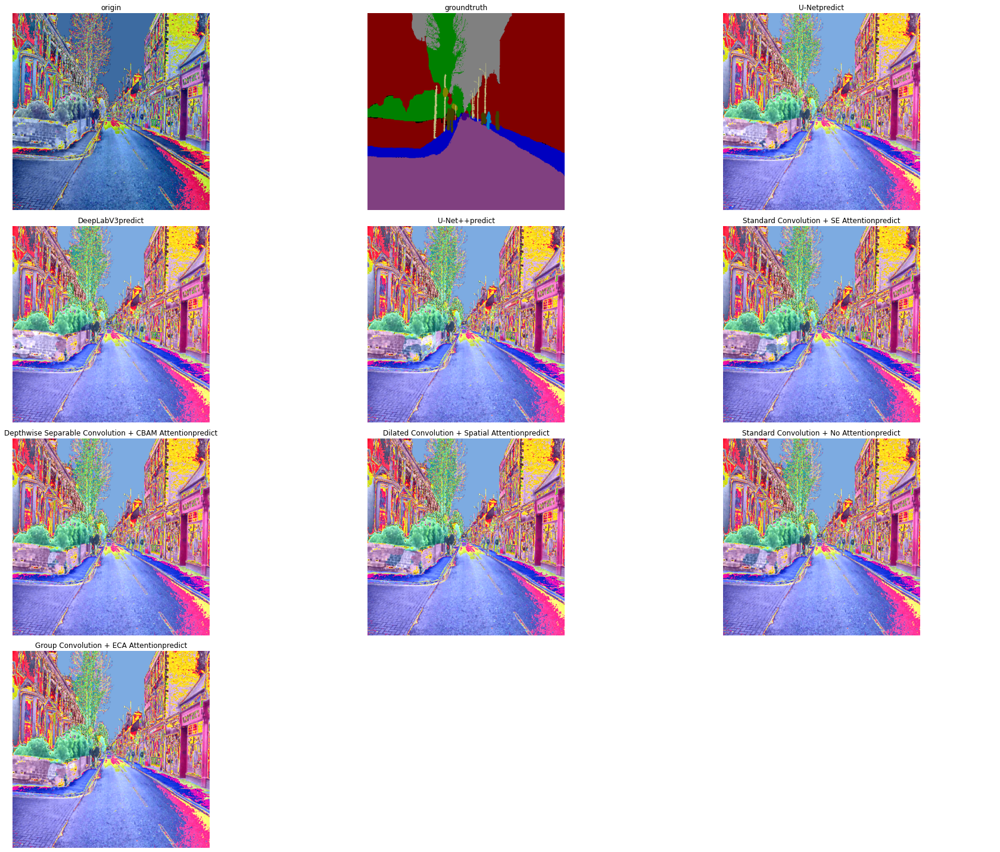

样本 Seq05VD_f01110.png 处理完成，结果已保存到 ./visualization_results-23/Seq05VD_f01110.png_model_comparison.png

处理样本 2/5 (索引: 126)...


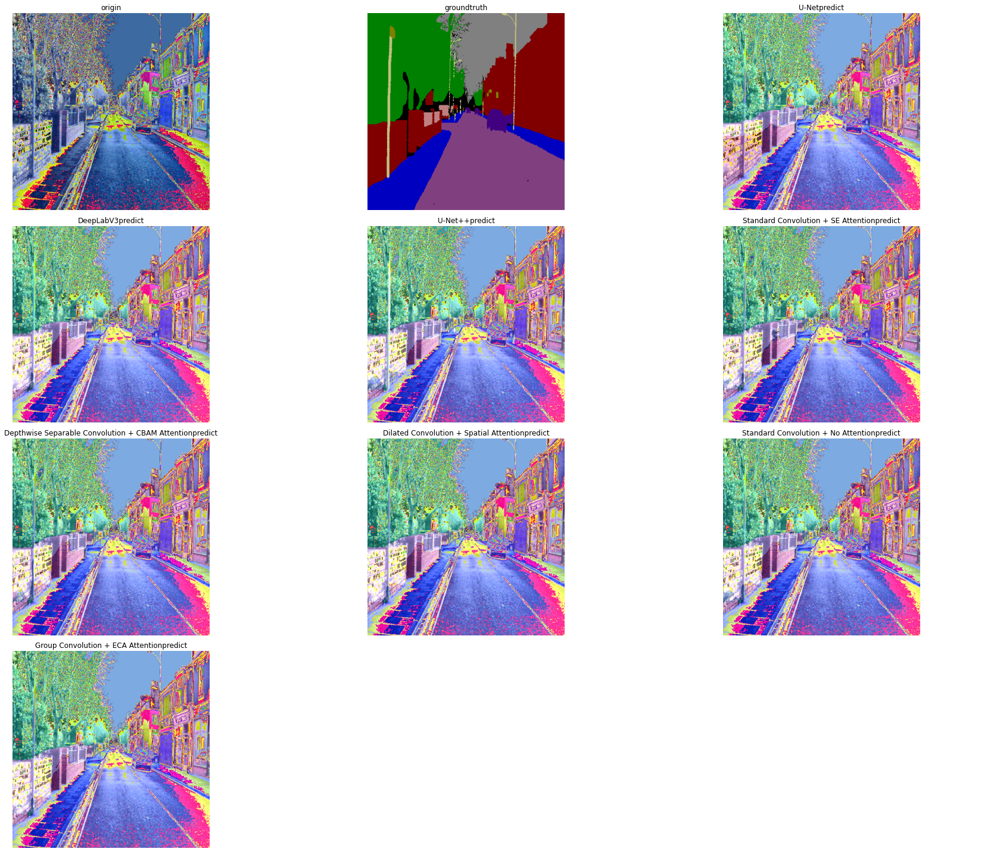

样本 Seq05VD_f01380.png 处理完成，结果已保存到 ./visualization_results-23/Seq05VD_f01380.png_model_comparison.png

处理样本 3/5 (索引: 172)...


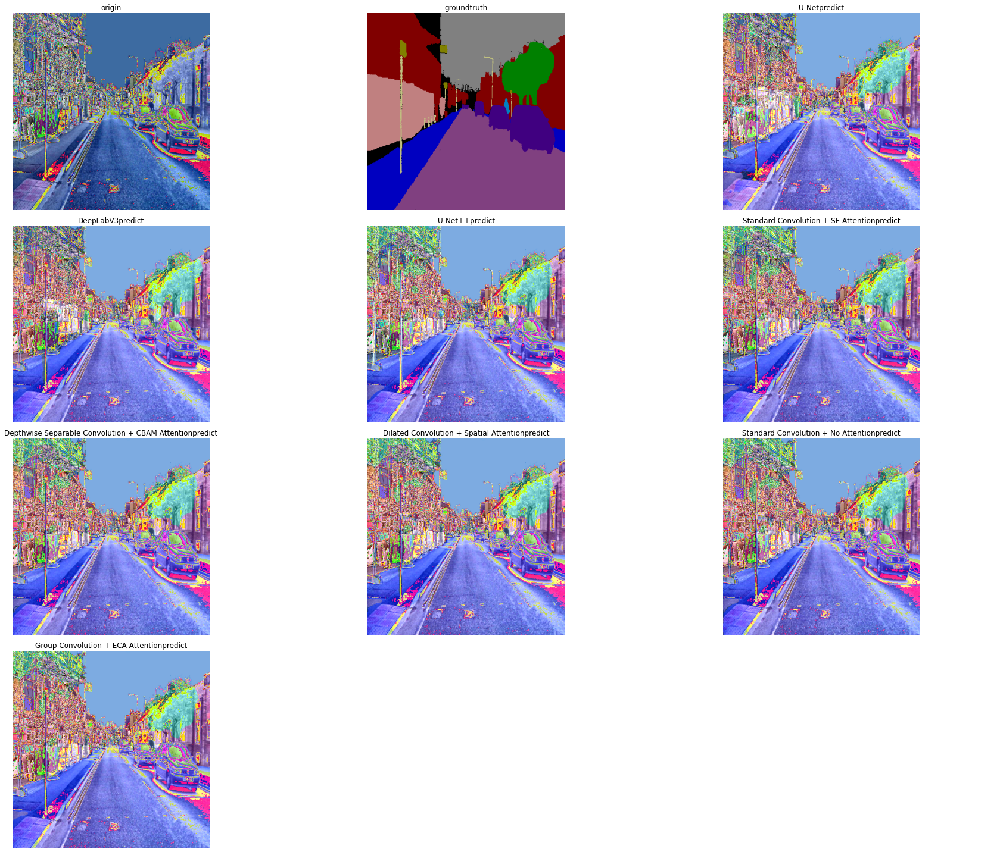

样本 Seq05VD_f05040.png 处理完成，结果已保存到 ./visualization_results-23/Seq05VD_f05040.png_model_comparison.png

处理样本 4/5 (索引: 127)...


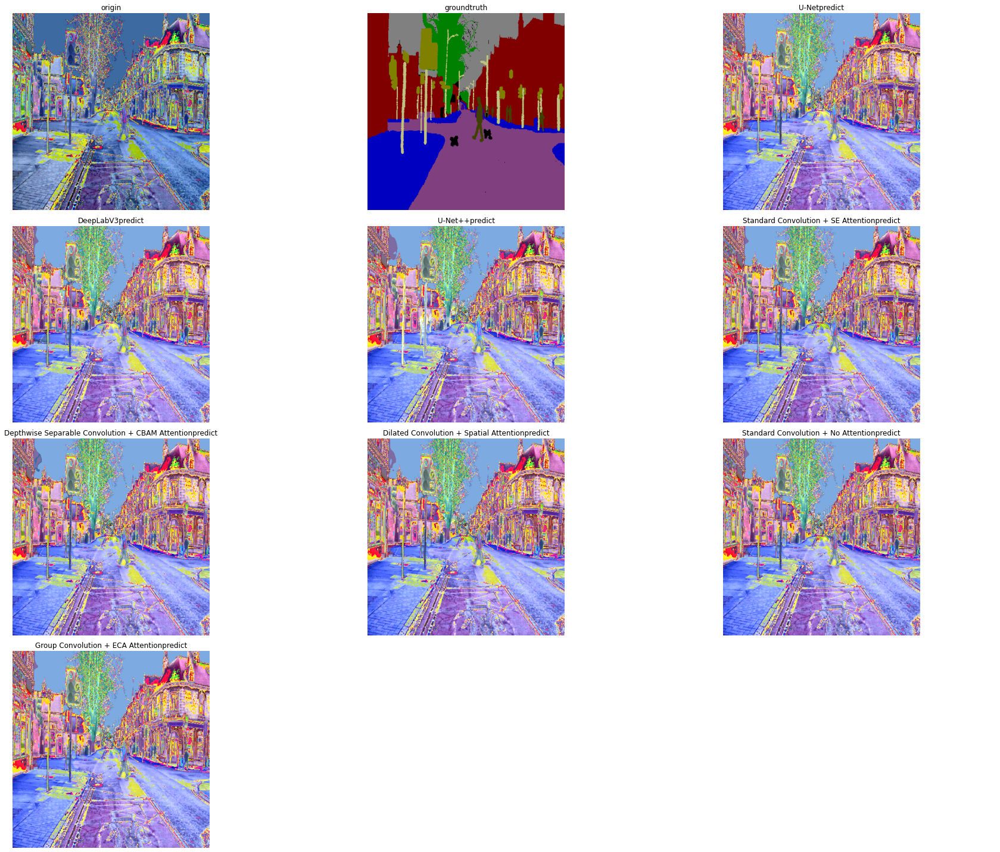

样本 Seq05VD_f02070.png 处理完成，结果已保存到 ./visualization_results-23/Seq05VD_f02070.png_model_comparison.png

处理样本 5/5 (索引: 204)...


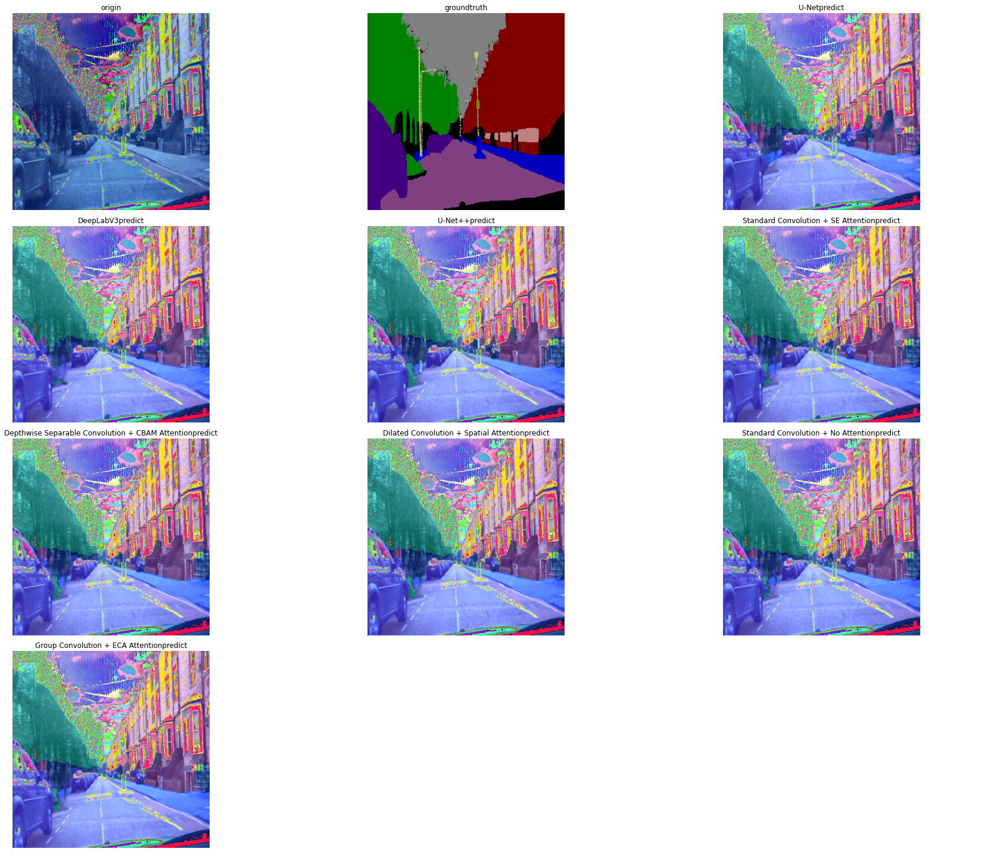

样本 0001TP_010230.png 处理完成，结果已保存到 ./visualization_results-23/0001TP_010230.png_model_comparison.png

所有样本处理完成！结果保存在 ./visualization_results-23 目录中。


In [18]:
# 执行可视化（取消注释以运行）
load_and_visualize_models()

## 单独的分割结果可视化

In [15]:
def visualize_class_wise_segmentation(
    original_image, 
    ground_truth, 
    predictions, 
    model_names, 
    class_names=CLASSES,
    colors=None,
    image_name='test',
    output_dir='./class_wise_results',
    figsize=(20, 15)
):
    """按类别分开可视化分割结果"""
    
    if colors is None:
        # 为每个类别定义颜色（紫色和黄色主题）
        colors = [
            (128, 128, 128),  # sky - 灰色
            (128, 0, 0),      # building - 深红
            (255, 255, 0),    # pole - 黄色
            (128, 64, 128),   # road - 紫色
            (0, 0, 192),      # pavement - 蓝色
            (0, 128, 0),      # tree - 绿色
            (128, 128, 0),    # signsymbol - 橄榄色
            (192, 128, 128),  # fence - 粉红
            (64, 0, 128),     # car - 深紫
            (64, 64, 0),      # pedestrian - 深橄榄
            (0, 128, 192),    # bicyclist - 青色
            (0, 0, 0)         # unlabelled - 黑色
        ]
    
    num_models = len(predictions)
    num_classes = len(class_names)
    
    # 创建子图：原图 + 真值 + 各模型预测
    cols = num_models + 2  # 原图 + 真值 + 模型数量
    rows = num_classes
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    # 为每个类别创建一行
    for class_idx in range(num_classes):
        class_name = class_names[class_idx]
        color = colors[class_idx]
        
        # 第一列：原始图像（只在第一行显示）
        if class_idx == 0:
            axes[class_idx, 0].imshow(original_image)
            axes[class_idx, 0].set_title('Original Image', fontsize=10)
        else:
            axes[class_idx, 0].imshow(original_image)
            axes[class_idx, 0].set_title('', fontsize=10)
        axes[class_idx, 0].axis('off')
        
        # 第二列：真值掩码（当前类别）
        gt_display = original_image.copy()
        if class_idx < ground_truth.shape[2]:
            class_mask = ground_truth[:, :, class_idx] > 0.5
            # 将非当前类别的区域设为黑色
            gt_display[~class_mask] = [0, 0, 0]
            # 当前类别保持原色并添加颜色标识
            gt_display[class_mask] = np.array(color)
        else:
            gt_display = np.zeros_like(original_image)
        
        gt_overlay = gt_display
        axes[class_idx, 1].imshow(gt_overlay)
        if class_idx == 0:
            axes[class_idx, 1].set_title('Ground Truth', fontsize=10)
        axes[class_idx, 1].axis('off')
        
        # 添加类别标签（在左侧）
        axes[class_idx, 0].text(-0.1, 0.5, class_name, 
                               transform=axes[class_idx, 0].transAxes,
                               rotation=90, va='center', ha='right',
                               fontsize=12, fontweight='bold')
        
        # 其余列：各模型预测（当前类别）
        for model_idx, (pred, model_name) in enumerate(zip(predictions, model_names)):
            col_idx = model_idx + 2
            
            pred_display = original_image.copy()
            if class_idx < pred.shape[2]:
                class_pred = pred[:, :, class_idx] > 0.5
                # 将非当前类别的区域设为黑色
                pred_display[~class_pred] = [0, 0, 0]
                # 当前类别保持原色并添加颜色标识
                pred_display[class_pred] = np.array(color)
            else:
                pred_display = np.zeros_like(original_image)
            
            pred_overlay = pred_display
            axes[class_idx, col_idx].imshow(pred_overlay)
            
            # 只在第一行添加模型名称
            if class_idx == 0:
                axes[class_idx, col_idx].set_title(model_name, fontsize=10)
            
            axes[class_idx, col_idx].axis('off')
    
    plt.tight_layout()
    
    # 确保输出目录存在
    os.makedirs(output_dir, exist_ok=True)
    
    # 保存结果
    save_path = os.path.join(output_dir, f'{image_name}_class_wise_comparison.png')
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()
    
    return save_path


In [16]:
# 主函数
def load_and_visualize_class_wise():
    """加载模型并进行分类可视化对比"""
    
    # 配置参数
    DATA_DIR = './CamVid/'
    x_test_dir = os.path.join(DATA_DIR, 'test')
    y_test_dir = os.path.join(DATA_DIR, 'testannot')
    
    ENCODER = 'resnet34'
    ENCODER_WEIGHTS = 'imagenet'
    ACTIVATION = 'sigmoid'
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    print(f'使用设备: {DEVICE}')
    
    # 确保输出目录存在
    output_dir = './class_wise_visualization_results'
    os.makedirs(output_dir, exist_ok=True)
    
    # 加载预处理函数
    preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)
    
    # 初始化测试数据集
    test_dataset = CamVidDataset(
        x_test_dir,
        y_test_dir,
        augmentation=get_validation_augmentation(),
        preprocessing=get_preprocessing(preprocessing_fn),
        classes=CLASSES,
    )
    
    print(f'测试集样本数量: {len(test_dataset)}')
    
    # 随机选择样本进行可视化
    num_samples = 3
    sample_indices = random.sample(range(len(test_dataset)), num_samples)
    print(f'选择的样本索引: {sample_indices}')
    
    # 加载基础模型
    print("\n加载基础模型...")
    model_unet = smp.Unet(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
    ).to(DEVICE)
    
    model_deeplabv3 = smp.DeepLabV3(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
    ).to(DEVICE)
    
    model_unetplusplus = smp.UnetPlusPlus(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
        decoder_attention_type='scse',
    ).to(DEVICE)
    
    # 加载基础模型权重
    try:
        model_unet.load_state_dict(torch.load('./best_model_unet_params.pth', map_location=DEVICE))
        model_deeplabv3.load_state_dict(torch.load('./best_model_deeplabv3_params.pth', map_location=DEVICE))
        model_unetplusplus.load_state_dict(torch.load('./best_model_unetplusplus_params.pth', map_location=DEVICE))
        print("基础模型权重加载成功")
    except FileNotFoundError as e:
        print(f"警告: 基础模型权重文件未找到 - {e}")
        return
    
    model_unet.eval()
    model_deeplabv3.eval()
    model_unetplusplus.eval()
    
    # 加载元模型变体
    print("\n加载元模型变体...")
    meta_models = create_model_variants(len(CLASSES))
    
    # 模型文件映射
    model_files = {
        'standard_se': './Meta_standard_se.pth',
        'depthwise_cbam': './Meta_depthwise_cbam.pth', 
        'dilated_spatial': './Meta_dilated_spatial.pth',
        'standard_none': './Meta_standard_none.pth',
        'group_eca': './Meta_group_eca.pth'
    }
    
    # 加载已训练的元模型权重
    loaded_meta_models = {}
    for model_name, model in meta_models.items():
        model_file = model_files.get(model_name)
        if model_file and os.path.exists(model_file):
            try:
                model.load_state_dict(torch.load(model_file, map_location=DEVICE))
                model.to(DEVICE)
                model.eval()
                loaded_meta_models[model_name] = model
                print(f"成功加载 {model_name} 模型")
            except Exception as e:
                print(f"加载 {model_name} 模型失败: {e}")
        else:
            print(f"警告: 未找到模型文件 {model_file}")
    
    if not loaded_meta_models:
        print("错误: 未找到任何训练好的元模型文件")
        return
    
    # 模型名称映射（用于显示）
    model_display_names = {
        'standard_se': 'Standard+SE',
        'depthwise_cbam': 'Depthwise+CBAM',
        'dilated_spatial': 'Dilated+Spatial',
        'standard_none': 'Standard+None',
        'group_eca': 'Group+ECA'
    }
    
    print(f"\n开始处理 {num_samples} 个测试样本...")
    
    # 处理每个选中的样本
    for sample_idx, idx in enumerate(sample_indices):
        print(f"\n处理样本 {sample_idx+1}/{num_samples} (索引: {idx})...")
        
        # 获取样本
        image_tensor, mask_tensor = test_dataset[idx]
        image_name = os.path.basename(test_dataset.images_fps[idx]).split('.')[0]
        
        # 转换为numpy格式用于可视化
        original_image = (image_tensor.transpose(1, 2, 0) * 255).astype(np.uint8)
        ground_truth = mask_tensor.transpose(1, 2, 0)
        
        # 准备输入张量
        input_tensor = torch.from_numpy(image_tensor).unsqueeze(0).to(DEVICE)
        
        # 基础模型预测
        with torch.no_grad():
            pred_unet = model_unet(input_tensor).cpu().numpy()[0].transpose(1, 2, 0)
            pred_deeplabv3 = model_deeplabv3(input_tensor).cpu().numpy()[0].transpose(1, 2, 0)
            pred_unetplusplus = model_unetplusplus(input_tensor).cpu().numpy()[0].transpose(1, 2, 0)
        
        # 准备元模型输入（基础模型预测的拼接）
        meta_input = np.concatenate([pred_unet, pred_deeplabv3, pred_unetplusplus], axis=2)
        meta_input_tensor = torch.from_numpy(meta_input.transpose(2, 0, 1)).unsqueeze(0).to(DEVICE)
        
        # 元模型预测
        meta_predictions = {}
        with torch.no_grad():
            for model_name, model in loaded_meta_models.items():
                pred = model(meta_input_tensor).cpu().numpy()[0].transpose(1, 2, 0)
                meta_predictions[model_name] = pred
        
        # 准备所有预测结果
        all_predictions = [pred_unet, pred_deeplabv3, pred_unetplusplus]
        all_model_names = ['U-Net', 'DeepLabV3', 'U-Net++']
        
        # 添加元模型预测
        for model_name, pred in meta_predictions.items():
            all_predictions.append(pred)
            all_model_names.append(model_display_names[model_name])
        
        # 生成分类可视化
        save_path = visualize_class_wise_segmentation(
            original_image, 
            ground_truth, 
            all_predictions,
            all_model_names,
            class_names=CLASSES,
            image_name=f'sample_{idx}_{image_name}',
            output_dir=output_dir,
            figsize=(25, 30)
        )
        
        print(f"样本 {image_name} 分类可视化完成，结果已保存到 {save_path}")
    
    print(f"\n所有样本处理完成！结果保存在 {output_dir} 目录中。")

使用设备: cuda
测试集样本数量: 233
选择的样本索引: [62, 89, 231]

加载基础模型...
基础模型权重加载成功

加载元模型变体...
成功加载 standard_se 模型
成功加载 depthwise_cbam 模型
成功加载 dilated_spatial 模型
成功加载 standard_none 模型
成功加载 group_eca 模型

开始处理 3 个测试样本...

处理样本 1/3 (索引: 62)...


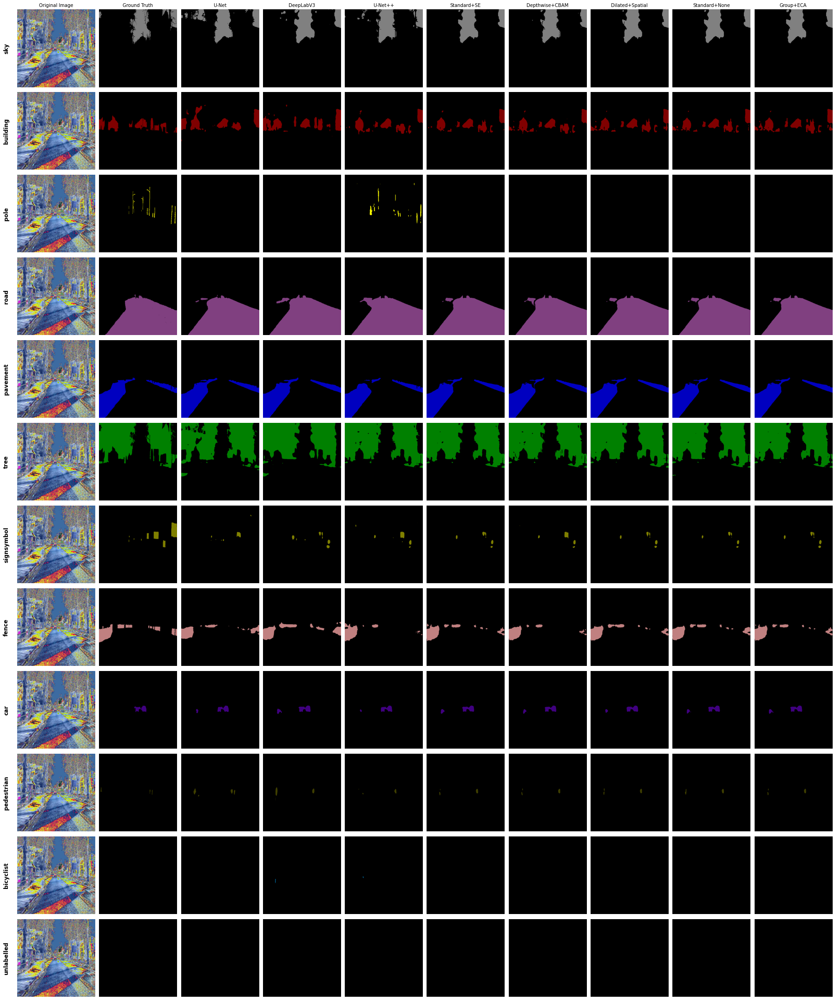

样本 Seq05VD_f00120 分类可视化完成，结果已保存到 ./class_wise_visualization_results/sample_62_Seq05VD_f00120_class_wise_comparison.png

处理样本 2/3 (索引: 89)...


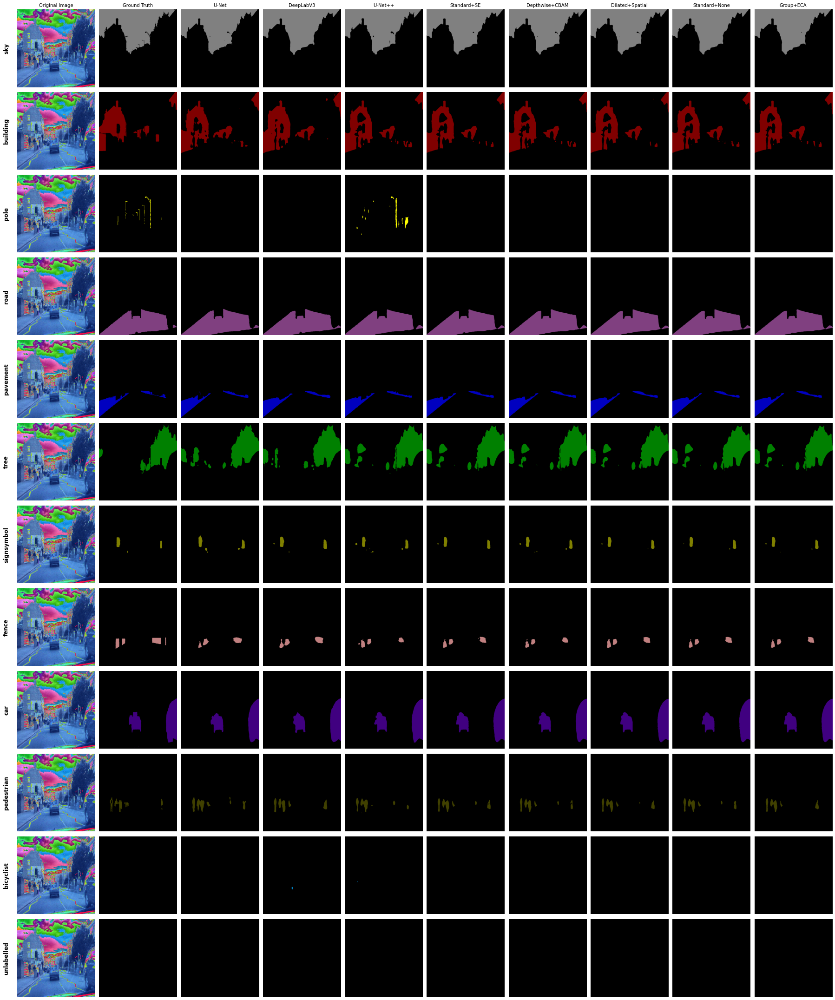

样本 0001TP_009900 分类可视化完成，结果已保存到 ./class_wise_visualization_results/sample_89_0001TP_009900_class_wise_comparison.png

处理样本 3/3 (索引: 231)...


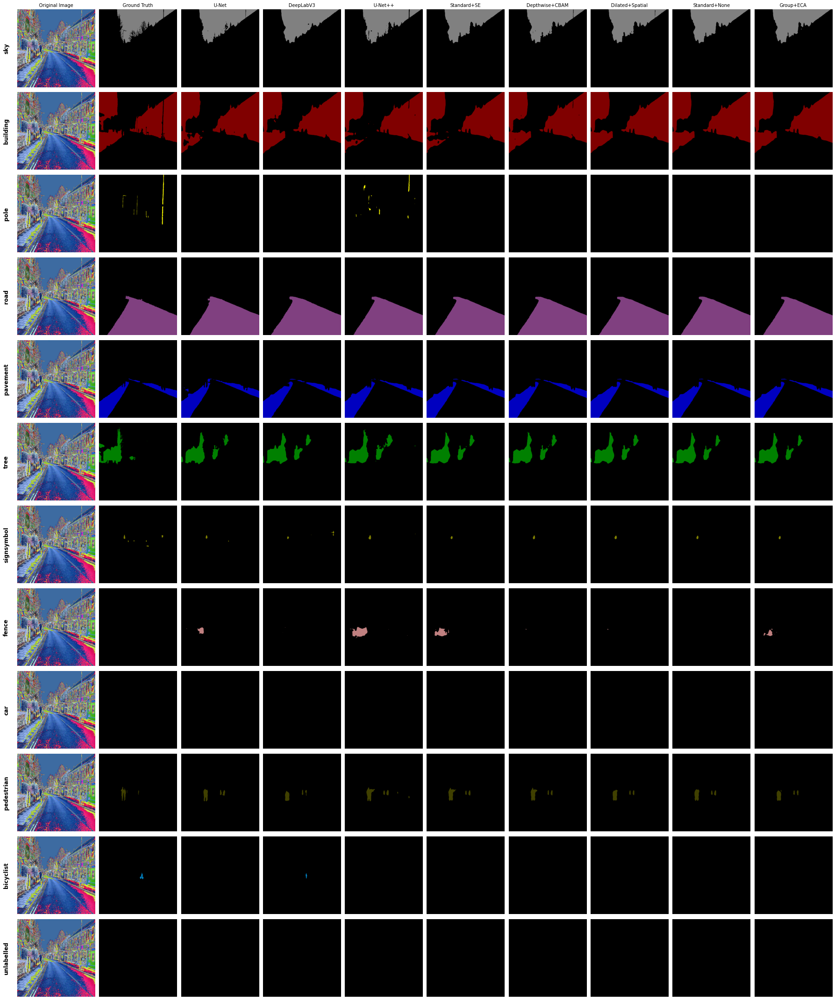

样本 Seq05VD_f04710 分类可视化完成，结果已保存到 ./class_wise_visualization_results/sample_231_Seq05VD_f04710_class_wise_comparison.png

所有样本处理完成！结果保存在 ./class_wise_visualization_results 目录中。


In [17]:
load_and_visualize_class_wise()

## 添加的iou图

In [19]:
# ==================== 计算IoU ====================

def calculate_iou_per_class(gt_mask, pred_mask, num_classes):
    """计算每个类别的IoU"""
    iou_per_class = []
    
    for i in range(num_classes):
        gt = gt_mask[i].astype(np.bool_)
        pred = pred_mask[i].astype(np.bool_)
        
        intersection = np.logical_and(gt, pred)
        union = np.logical_or(gt, pred)
        
        if np.sum(union) == 0:
            iou = 1.0  # 如果没有真值和预测值，IoU为1
        else:
            iou = np.sum(intersection) / np.sum(union)
        
        iou_per_class.append(iou)
    
    return iou_per_class

In [20]:
# ==================== 评估单个模型 ====================

def evaluate_model(model, test_loader, base_models, model_name, device, classes):
    """评估单个元模型"""
    print(f"\n{'='*50}")
    print(f"Evaluating {model_name}")
    print(f"{'='*50}")
    
    model.eval()
    for base_model in base_models:
        base_model.eval()
    
    total_iou_per_class = np.zeros(len(classes))
    sample_count = 0
    
    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            
            # 获取基础模型的预测
            pred_unetplusplus = base_models[0](images)
            pred_unet = base_models[1](images)
            pred_deeplabv3 = base_models[2](images)
            
            # 合并基础模型的预测
            combined_pred = torch.cat([pred_unetplusplus, pred_unet, pred_deeplabv3], dim=1)
            
            # 使用元模型进行预测
            meta_pred = model(combined_pred)
            
            # 将预测转换为numpy数组
            meta_pred_np = meta_pred.squeeze().cpu().numpy()
            masks_np = masks.squeeze().cpu().numpy()
            
            # 二值化预测结果
            meta_pred_binary = (meta_pred_np > 0.5).astype(np.float32)
            
            # 计算每个类别的IoU
            iou_per_class = calculate_iou_per_class(masks_np, meta_pred_binary, len(classes))
            total_iou_per_class += np.array(iou_per_class)
            
            sample_count += 1
    
    # 计算平均IoU
    avg_iou_per_class = total_iou_per_class / sample_count
    global_iou = np.mean(avg_iou_per_class)
    
    # 打印每个类别的IoU
    print("IoU per class:")
    for i, class_name in enumerate(classes):
        print(f"{class_name}: {avg_iou_per_class[i]:.4f}")
    
    print(f"\nGlobal IoU: {global_iou:.4f}")
    
    return avg_iou_per_class, global_iou


In [21]:
# ==================== 可视化结果 ====================

def visualize_results(all_results, classes):
    """可视化所有模型的IoU结果"""
    # 为每个类别定义固定颜色
    class_colors = {
        'sky': '#87CEEB',           # 天蓝色
        'building': '#8B4513',      # 棕色
        'pole': '#696969',          # 暗灰色
        'road': '#2F4F4F',          # 深灰色
        'pavement': '#D3D3D3',      # 浅灰色
        'tree': '#228B22',          # 森林绿
        'signsymbol': '#FFD700',    # 金色
        'fence': '#8B4513',         # 棕色
        'car': '#FF4500',           # 橙红色
        'pedestrian': '#FF69B4',    # 热粉色
        'bicyclist': '#00CED1',     # 深绿松石色
        'unlabelled': '#708090'     # 石板灰
    }
    
    # 创建颜色列表，按类别顺序排列
    colors = [class_colors.get(class_name, '#1f77b4') for class_name in classes]
    
    # 创建子图
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    model_names = list(all_results.keys())
    
    # 为每个模型创建一个子图
    for i, (model_name, (iou_per_class, global_iou)) in enumerate(all_results.items()):
        ax = axes[i]
        bars = ax.bar(classes, iou_per_class, alpha=0.8, color=colors)
        ax.axhline(y=global_iou, color='red', linestyle='--', linewidth=2,
                  label=f'Global IoU: {global_iou:.4f}')
        ax.set_xlabel('Class')
        ax.set_ylabel('IoU')
        ax.set_title(f'IoU per Class for {model_name}', fontweight='bold')
        ax.tick_params(axis='x', rotation=45)
        ax.legend()
        ax.grid(True, alpha=0.3)
        
        # 为每个柱子添加数值标签
        for bar, iou in zip(bars, iou_per_class):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                   f'{iou:.3f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
    
    # 隐藏最后一个空的子图
    if len(model_names) < 6:
        axes[5].set_visible(False)
    
    plt.tight_layout()
    plt.savefig('meta_models_iou_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 创建全局IoU对比图
    plt.figure(figsize=(12, 6))
    global_ious = [result[1] for result in all_results.values()]
    
    # 为不同模型定义不同颜色
    model_colors = {
        'standard_se': '#2E8B57',        # 海绿色
        'depthwise_cbam': '#4169E1',     # 皇家蓝
        'dilated_spatial': '#DC143C',    # 深红色
        'standard_none': '#FF8C00',      # 深橙色
        'group_eca': '#9932CC'           # 深紫色
    }
    
    # 创建颜色列表，按模型顺序排列
    bar_colors = [model_colors.get(model_name, '#1f77b4') for model_name in model_names]
    
    bars = plt.bar(model_names, global_ious, alpha=0.8, color=bar_colors)
    plt.xlabel('Model Variant', fontweight='bold')
    plt.ylabel('Global IoU', fontweight='bold')
    plt.title('Global IoU Comparison Across Model Variants', fontweight='bold', fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, alpha=0.3)
    
    # 为每个柱子添加数值标签
    for bar, iou in zip(bars, global_ious):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.005,
                f'{iou:.4f}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    plt.tight_layout()
    plt.savefig('global_iou_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

# ==================== 主函数 ====================

def visual_main():
    # 设置参数
    DATA_DIR = './CamVid/'
    x_test_dir = os.path.join(DATA_DIR, 'test')
    y_test_dir = os.path.join(DATA_DIR, 'testannot')
    
    ENCODER = 'resnet34'
    ENCODER_WEIGHTS = 'imagenet'
    CLASSES = ['sky', 'building', 'pole', 'road', 'pavement', 'tree', 'signsymbol', 'fence', 'car', 'pedestrian', 'bicyclist', 'unlabelled']
    ACTIVATION = 'sigmoid'
    
    preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)
    
    # 初始化测试数据集
    test_dataset = CamVidDataset(
        x_test_dir,
        y_test_dir,
        augmentation=get_validation_augmentation(),
        preprocessing=get_preprocessing(preprocessing_fn),
        classes=CLASSES,
    )
    
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)
    
    # 加载基础模型
    print("Loading base models...")
    model_unet = smp.Unet(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
    ).to(DEVICE)
    
    model_deeplabv3 = smp.DeepLabV3(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
    ).to(DEVICE)
    
    model_unetplusplus = smp.UnetPlusPlus(
        encoder_name=ENCODER,
        encoder_weights=ENCODER_WEIGHTS,
        classes=len(CLASSES),
        activation=ACTIVATION,
        decoder_attention_type='scse',
    ).to(DEVICE)
    
    # 加载预训练权重
    model_unet.load_state_dict(torch.load('best_model_unet_params.pth', map_location=DEVICE))
    model_deeplabv3.load_state_dict(torch.load('best_model_deeplabv3_params.pth', map_location=DEVICE))
    model_unetplusplus.load_state_dict(torch.load('best_model_unetplusplus_params.pth', map_location=DEVICE))
    
    base_models = [model_unetplusplus, model_unet, model_deeplabv3]
    
    # 创建元模型变体
    print("Creating meta model variants...")
    meta_models = create_model_variants(NUM_CLASSES)
    
    # 加载训练好的元模型权重并评估
    all_results = {}
    model_files = {
        'standard_se': 'Meta_standard_se.pth',
        'depthwise_cbam': 'Meta_depthwise_cbam.pth',
        'dilated_spatial': 'Meta_dilated_spatial.pth',
        'standard_none': 'Meta_standard_none.pth',
        'group_eca': 'Meta_group_eca.pth'
    }
    
    for model_name, model in meta_models.items():
        model_file = model_files[model_name]
        if os.path.exists(model_file):
            print(f"\nLoading {model_file}...")
            model.load_state_dict(torch.load(model_file, map_location=DEVICE))
            model = model.to(DEVICE)
            
            # 评估模型
            iou_per_class, global_iou = evaluate_model(
                model, test_loader, base_models, model_name, DEVICE, CLASSES
            )
            all_results[model_name] = (iou_per_class, global_iou)
        else:
            print(f"Warning: Model file {model_file} not found, skipping {model_name}")
    
    # 可视化结果
    if all_results:
        print("\n" + "="*60)
        print("VISUALIZATION RESULTS")
        print("="*60)
        visualize_results(all_results, CLASSES)
        
        # 保存结果到JSON文件
        results_dict = {}
        for model_name, (iou_per_class, global_iou) in all_results.items():
            results_dict[model_name] = {
                'iou_per_class': iou_per_class.tolist(),
                'global_iou': float(global_iou),
                'class_names': CLASSES
            }
        
        with open('meta_models_evaluation_results.json', 'w') as f:
            json.dump(results_dict, f, indent=2)
        
        print("\nResults saved to:")
        print("- meta_models_iou_comparison.png")
        print("- global_iou_comparison.png")
        print("- meta_models_evaluation_results.json")
    else:
        print("No model files found for evaluation.")


Loading base models...
Creating meta model variants...

Loading Meta_standard_se.pth...

Evaluating standard_se
IoU per class:
sky: 0.9010
building: 0.7569
pole: 0.2441
road: 0.9538
pavement: 0.8491
tree: 0.6374
signsymbol: 0.4145
fence: 0.4826
car: 0.7427
pedestrian: 0.4045
bicyclist: 0.6909
unlabelled: 0.2633

Global IoU: 0.6117

Loading Meta_depthwise_cbam.pth...

Evaluating depthwise_cbam
IoU per class:
sky: 0.9025
building: 0.7590
pole: 0.2425
road: 0.9532
pavement: 0.8465
tree: 0.6379
signsymbol: 0.4165
fence: 0.5297
car: 0.7485
pedestrian: 0.3999
bicyclist: 0.6853
unlabelled: 0.2634

Global IoU: 0.6154

Loading Meta_dilated_spatial.pth...

Evaluating dilated_spatial
IoU per class:
sky: 0.9003
building: 0.7590
pole: 0.2496
road: 0.9529
pavement: 0.8469
tree: 0.6397
signsymbol: 0.4206
fence: 0.5113
car: 0.7491
pedestrian: 0.4047
bicyclist: 0.6695
unlabelled: 0.2668

Global IoU: 0.6142

Loading Meta_standard_none.pth...

Evaluating standard_none
IoU per class:
sky: 0.8988
building:

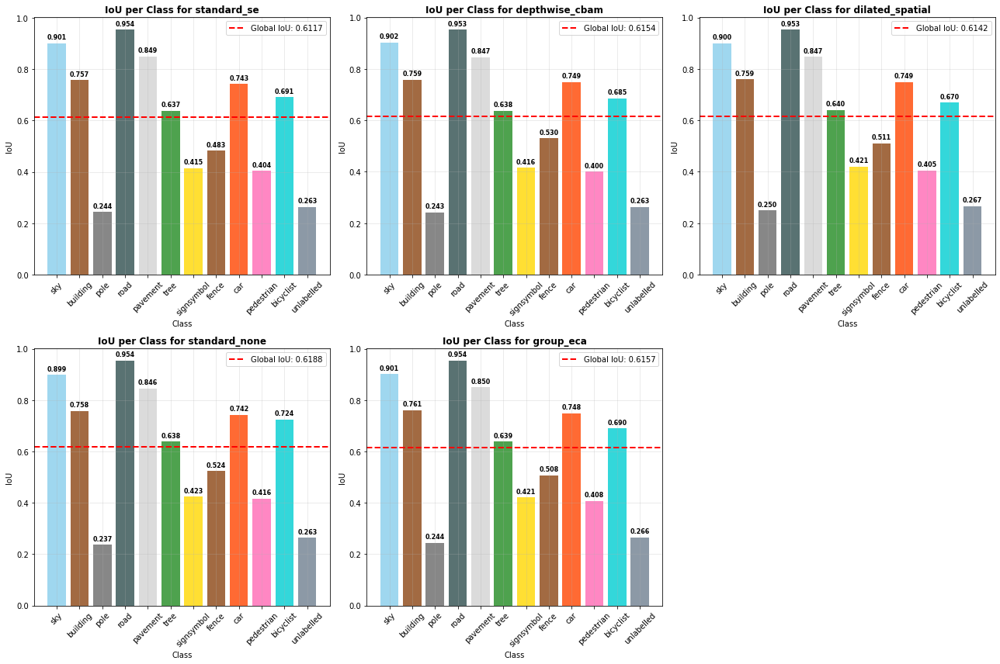

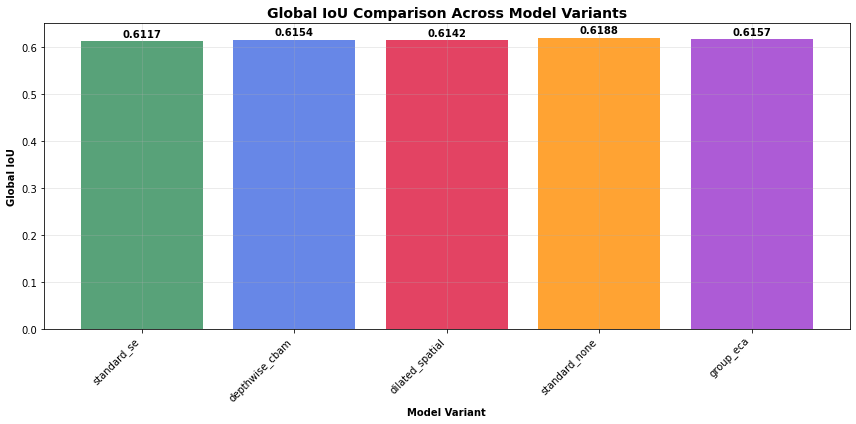


Results saved to:
- meta_models_iou_comparison.png
- global_iou_comparison.png
- meta_models_evaluation_results.json


In [22]:
visual_main()